# Data Science DJ

## By Griffin Olson-Allen

## Cleaning, visualizing, and predicting using the song data gathered in dataCollection.py

## Part 1: Cleaning

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("song_data.csv")

In [4]:
len(df)

1038

In [5]:
df.head()

,name,id,duration_ms_x,explicit,popularity,danceability,energy,key,loudness,mode,...,type,uri,track_href,analysis_url,duration_ms_y,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate,error
0,Paradise (feat. Dermot Kennedy),6ft4hAq6yde8jPZY2i5zLr,167903,False,90,0.632,0.595,8.0,-7.644,0.0,...,audio_features,spotify:track:6ft4hAq6yde8jPZY2i5zLr,https://api.spotify.com/v1/tracks/6ft4hAq6yde8...,https://api.spotify.com/v1/audio-analysis/6ft4...,167903.0,4.0,0.00000,164.94295,22050,NaN
1,What's Love Got to Do with It,3Be7CLdHZpyzsVijme39cW,208156,False,80,0.750,0.664,8.0,-5.908,0.0,...,audio_features,spotify:track:3Be7CLdHZpyzsVijme39cW,https://api.spotify.com/v1/tracks/3Be7CLdHZpyz...,https://api.spotify.com/v1/audio-analysis/3Be7...,208156.0,4.0,0.17941,200.16762,22050,NaN
2,All You Need To Know (feat. Calle Lehmann),4Gcv5SsxnQWpmOnUI19EJk,238458,False,72,0.513,0.788,0.0,-4.629,1.0,...,audio_features,spotify:track:4Gcv5SsxnQWpmOnUI19EJk,https://api.spotify.com/v1/tracks/4Gcv5SsxnQWp...,https://api.spotify.com/v1/audio-analysis/4Gcv...,238459.0,4.0,3.70939,230.09235,22050,NaN
3,Dreamers,1MF0hyC0NLN0IcI4FpQKYl,181935,False,50,0.780,0.808,7.0,-4.913,1.0,...,audio_features,spotify:track:1MF0hyC0NLN0IcI4FpQKYl,https://api.spotify.com/v1/tracks/1MF0hyC0NLN0...,https://api.spotify.com/v1/audio-analysis/1MF0...,181935.0,4.0,0.47596,177.35982,22050,NaN
4,Big Love (with Wrabel),0PGpWcKIlayTwPdz6Qstol,182115,False,57,0.483,0.761,8.0,-7.150,0.0,...,audio_features,spotify:track:0PGpWcKIlayTwPdz6Qstol,https://api.spotify.com/v1/tracks/0PGpWcKIlayT...,https://api.spotify.com/v1/audio-analysis/0PGp...,182116.0,4.0,2.17107,176.52971,22050,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1038 entries, 0 to 1037
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   name                  1038 non-null   object 
 1   id                    1038 non-null   object 
 2   duration_ms_x         1038 non-null   int64  
 3   explicit              1038 non-null   bool   
 4   popularity            1038 non-null   int64  
 5   danceability          1038 non-null   float64
 6   energy                1038 non-null   float64
 7   key                   1038 non-null   float64
 8   loudness              1038 non-null   float64
 9   mode                  1038 non-null   float64
 10  speechiness           1038 non-null   float64
 11  acousticness          1038 non-null   float64
 12  instrumentalness      1038 non-null   float64
 13  liveness              1038 non-null   float64
 14  valence               1038 non-null   float64
 15  tempo                

## Features

#### name: The name of the track.
#### id: The Spotify ID for the track
#### duration_ms_x: The track length in milliseconds.
#### explicit: Whether or not the track has explicit lyrics ( true = yes it does; false = no it does not OR unknown).
#### popularity: The popularity of the track. The value will be between 0 and 100, with 100 being the most popular.
#### danceability: Danceability describes how suitable a track is for dancing based on a combination of musical elements.
#### energy: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.
#### key: The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.
#### loudness: The overall loudness of a track in decibels (dB).
#### mode: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.
#### speechiness: Speechiness detects the presence of spoken words in a track.
#### acousticness: A confidence measure from 0.0 to 1.0 of whether the track is acoustic.
#### instrumentalness: Predicts whether a track contains no vocals.
#### liveness: Detects the presence of an audience in the recording.
#### valence: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. 
#### tempo: The overall estimated tempo of a track in beats per minute (BPM).
#### type: The object type: “audio_features”
#### uri: The Spotify URI for the track.
#### track_href: A link to the Web API endpoint providing full details of the track.
#### analysis_url: An HTTP URL to access the full audio analysis of this track.
#### duration_ms_y: The track length in milliseconds
#### time_signature: An estimated overall time signature of a track
#### end_of_fade_in: Timestamp in seconds of end of the track fading in
#### start_of_fade_out: Timestamp in seconds of start of the track fading out
#### analysis_sample_rate: sample rate (how many times per second a sound is sampled) used in analysis
#### 

Because these songs were pulled from 7 different playlists, there could be a lot of overlap where 1 song is in 3 or 4 playlists and is in the dataframe 3 or 4 times. 
So our very first step will be to check for duplicates.

In [7]:
duplicate_df = df[df.duplicated(subset=['name'])]
duplicate_df["name"]

75                                         Lucky
132                Body Back (feat. Maia Wright)
133                                I Want It All
134                                    I'll Wait
135     Breathe - Dimitri Vangelis & Wyman Remix
                          ...                   
986                                     Hey Mami
994                                         Stay
1000                                       Intro
1021                       Roses - Imanbek Remix
1025                                       Dizzy
Name: name, Length: 120, dtype: object

In [8]:
df[df["name"] == "Roses - Imanbek Remix"]

,name,id,duration_ms_x,explicit,popularity,danceability,energy,key,loudness,mode,...,type,uri,track_href,analysis_url,duration_ms_y,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate,error
82,Roses - Imanbek Remix,24Yi9hE78yPEbZ4kxyoXAI,176840,True,90,0.770,0.724,8.0,-5.484,1.0,...,audio_features,spotify:track:24Yi9hE78yPEbZ4kxyoXAI,https://api.spotify.com/v1/tracks/24Yi9hE78yPE...,https://api.spotify.com/v1/audio-analysis/24Yi...,176840.0,4.0,1.03950,173.77814,22050,NaN
209,Roses - Imanbek Remix,24Yi9hE78yPEbZ4kxyoXAI,176840,True,90,0.770,0.724,8.0,-5.484,1.0,...,audio_features,spotify:track:24Yi9hE78yPEbZ4kxyoXAI,https://api.spotify.com/v1/tracks/24Yi9hE78yPE...,https://api.spotify.com/v1/audio-analysis/24Yi...,176840.0,4.0,1.03950,173.77814,22050,NaN
1021,Roses - Imanbek Remix,2Wo6QQD1KMDWeFkkjLqwx5,176218,True,74,0.785,0.721,8.0,-5.457,1.0,...,audio_features,spotify:track:2Wo6QQD1KMDWeFkkjLqwx5,https://api.spotify.com/v1/tracks/2Wo6QQD1KMDW...,https://api.spotify.com/v1/audio-analysis/2Wo6...,176219.0,4.0,0.43542,173.17442,22050,NaN


The first and second are the exact same song duplicated. The second and third are the same song on different albumns. One is the single, the other is included on a full album, which is why they have different id's.

In [9]:
df[df["name"] == "Stay"]

,name,id,duration_ms_x,explicit,popularity,danceability,energy,key,loudness,mode,...,type,uri,track_href,analysis_url,duration_ms_y,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate,error
292,Stay,2ugjxfenU5AJMO5cozCuUv,194916,False,48,0.685,0.951,3.0,-4.889,0.0,...,audio_features,spotify:track:2ugjxfenU5AJMO5cozCuUv,https://api.spotify.com/v1/tracks/2ugjxfenU5AJ...,https://api.spotify.com/v1/audio-analysis/2ugj...,194916.0,4.0,0.00000,191.72136,22050,NaN
799,Stay,5Nd50WKhVieaCLWFJlcLT2,210857,False,30,0.729,0.704,7.0,-7.690,1.0,...,audio_features,spotify:track:5Nd50WKhVieaCLWFJlcLT2,https://api.spotify.com/v1/tracks/5Nd50WKhViea...,https://api.spotify.com/v1/audio-analysis/5Nd5...,210857.0,4.0,0.00000,199.12273,22050,NaN
994,Stay,3xmhECNTS8KZQ7C6ye7JIK,245326,False,46,0.231,0.465,6.0,-9.705,1.0,...,audio_features,spotify:track:3xmhECNTS8KZQ7C6ye7JIK,https://api.spotify.com/v1/tracks/3xmhECNTS8KZ...,https://api.spotify.com/v1/audio-analysis/3xmh...,245327.0,4.0,0.26685,236.59973,22050,NaN


These songs all have the same name but different ids so we might accidentally delete different songs if we filter duplicates based on name.

In [10]:
df.duplicated(subset=["name"]).value_counts()

False    918
True     120
dtype: int64

In [11]:
df.duplicated(subset=["id"]).value_counts()

False    944
True      94
dtype: int64

To air on the side of caution, we'll only delete duplicate ids since the remaining 26 songs with  duplicate names may or not be repeats.

In [12]:
df = df.drop_duplicates(subset=['id'])

In [13]:
sum(df.duplicated(subset = ["id"]))

0

Now that we have removed most duplicates, we can begin analyzing the data.

In [14]:
df.describe()

,duration_ms_x,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms_y,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate,error
count,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.0,0.0
mean,219760.225636,43.483051,0.622121,0.765781,5.500000,-5.643966,0.485169,0.075997,0.109521,0.155554,0.206735,0.366817,124.178453,219760.127119,3.991525,0.689903,212.496943,22050.0,NaN
std,56768.281313,21.897276,0.121056,0.148381,3.636156,2.284321,0.500045,0.072305,0.169090,0.285037,0.165790,0.205753,16.544259,56766.683397,0.172106,1.467243,55.897983,0.0,NaN
min,61022.000000,0.000000,0.184000,0.114000,0.000000,-20.792000,0.000000,0.025700,0.000023,0.000000,0.022200,0.031600,55.803000,61022.000000,1.000000,0.000000,61.022040,22050.0,NaN
25%,181003.000000,32.000000,0.544000,0.684750,2.000000,-6.841250,0.000000,0.039575,0.005755,0.000004,0.095050,0.195000,120.041500,181003.000000,4.000000,0.000000,174.725813,22050.0,NaN
50%,207048.500000,48.000000,0.629000,0.794000,6.000000,-5.318500,0.000000,0.051100,0.031850,0.001465,0.139000,0.351000,126.037000,207049.500000,4.000000,0.064305,199.793195,22050.0,NaN
75%,243543.250000,59.000000,0.706000,0.878000,9.000000,-3.995500,1.000000,0.079225,0.148000,0.134000,0.283500,0.510250,128.029000,243543.250000,4.000000,0.353948,235.582395,22050.0,NaN
max,463226.000000,90.000000,0.946000,0.999000,11.000000,-0.570000,1.000000,0.869000,0.967000,0.972000,0.956000,0.977000,212.137000,463227.000000,5.000000,10.385120,450.501950,22050.0,NaN


There are two different duration columns so we need to determine if there's a difference between them (x and y)
x is of type int while y is floating type

In [15]:
df[["duration_ms_x", "duration_ms_y"]].head()

,duration_ms_x,duration_ms_y
0,167903,167903.0
1,208156,208156.0
2,238458,238459.0
3,181935,181935.0
4,182115,182116.0


In [16]:
def is_whole(n):
    return n % 1 == 0

In [17]:
df["duration_ms_y"].apply(is_whole)

0       True
1       True
2       True
3       True
4       True
        ... 
1033    True
1034    True
1035    True
1036    True
1037    True
Name: duration_ms_y, Length: 944, dtype: bool

In [18]:
sum(df["duration_ms_y"].apply(is_whole))

944

All the durations are whole numbers so we can use the integer version and drop the float version

In [19]:
df = df.drop(["duration_ms_y"], axis = 1)

In [20]:
df.columns

Index(['name', 'id', 'duration_ms_x', 'explicit', 'popularity', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'type', 'uri',
       'track_href', 'analysis_url', 'time_signature', 'end_of_fade_in',
       'start_of_fade_out', 'analysis_sample_rate', 'error'],
      dtype='object')

Change now rename duration_ms_x to just duration_ms

In [21]:
df = df.rename(columns={"duration_ms_x": "duration_ms"})

In [22]:
df.head(1)

,name,id,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,...,tempo,type,uri,track_href,analysis_url,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate,error
0,Paradise (feat. Dermot Kennedy),6ft4hAq6yde8jPZY2i5zLr,167903,False,90,0.632,0.595,8.0,-7.644,0.0,...,124.114,audio_features,spotify:track:6ft4hAq6yde8jPZY2i5zLr,https://api.spotify.com/v1/tracks/6ft4hAq6yde8...,https://api.spotify.com/v1/audio-analysis/6ft4...,4.0,0.0,164.94295,22050,NaN


Next, we can look at the error column

In [23]:
df["error"]

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1033   NaN
1034   NaN
1035   NaN
1036   NaN
1037   NaN
Name: error, Length: 944, dtype: float64

In [24]:
sum(pd.isna(df["error"])) #can sum up booleans where True = 1 and False = 0

944

Since our sum is 1038 (the length of the dataframe) we know every row has a True value and therfore every row has a NaN value for error. Since every row has nothing in the error column, we can drop it as well

In [25]:
df = df.drop(["error"], axis = 1)

In [26]:
df.head(1)

,name,id,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,...,valence,tempo,type,uri,track_href,analysis_url,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate
0,Paradise (feat. Dermot Kennedy),6ft4hAq6yde8jPZY2i5zLr,167903,False,90,0.632,0.595,8.0,-7.644,0.0,...,0.435,124.114,audio_features,spotify:track:6ft4hAq6yde8jPZY2i5zLr,https://api.spotify.com/v1/tracks/6ft4hAq6yde8...,https://api.spotify.com/v1/audio-analysis/6ft4...,4.0,0.0,164.94295,22050


Now let's look at analysis sample rate

In [27]:
df["analysis_sample_rate"]

0       22050
1       22050
2       22050
3       22050
4       22050
        ...  
1033    22050
1034    22050
1035    22050
1036    22050
1037    22050
Name: analysis_sample_rate, Length: 944, dtype: int64

It seems to be the same for every row but let's check to make sure

In [28]:
df[df["analysis_sample_rate"] != 22050]

,name,id,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,...,valence,tempo,type,uri,track_href,analysis_url,time_signature,end_of_fade_in,start_of_fade_out,analysis_sample_rate


Every row has the same sample rate so this feature won't be any help to us and we can drop it

In [29]:
df = df.drop(["analysis_sample_rate"], axis = 1)

In [30]:
df.head(1)

,name,id,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,...,liveness,valence,tempo,type,uri,track_href,analysis_url,time_signature,end_of_fade_in,start_of_fade_out
0,Paradise (feat. Dermot Kennedy),6ft4hAq6yde8jPZY2i5zLr,167903,False,90,0.632,0.595,8.0,-7.644,0.0,...,0.209,0.435,124.114,audio_features,spotify:track:6ft4hAq6yde8jPZY2i5zLr,https://api.spotify.com/v1/tracks/6ft4hAq6yde8...,https://api.spotify.com/v1/audio-analysis/6ft4...,4.0,0.0,164.94295


In [31]:
df["type"]

0       audio_features
1       audio_features
2       audio_features
3       audio_features
4       audio_features
             ...      
1033    audio_features
1034    audio_features
1035    audio_features
1036    audio_features
1037    audio_features
Name: type, Length: 944, dtype: object

In [32]:
df[df["type"] != "audio_features"]

,name,id,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,...,liveness,valence,tempo,type,uri,track_href,analysis_url,time_signature,end_of_fade_in,start_of_fade_out


Type is also the same for every row

In [33]:
df = df.drop(["type"], axis = 1)

Let's see if uri, track_href, or analysis_url are interesting at all

In [34]:
df["uri"]

0       spotify:track:6ft4hAq6yde8jPZY2i5zLr
1       spotify:track:3Be7CLdHZpyzsVijme39cW
2       spotify:track:4Gcv5SsxnQWpmOnUI19EJk
3       spotify:track:1MF0hyC0NLN0IcI4FpQKYl
4       spotify:track:0PGpWcKIlayTwPdz6Qstol
                        ...                 
1033    spotify:track:0yixe2v2gvdFjjkYksdITQ
1034    spotify:track:4J2mpvxYoHzjUkCjn1WEfY
1035    spotify:track:1F4oy2dEExiaGFCgmO9VrB
1036    spotify:track:63wlUcpD7LiFbBueVQAis7
1037    spotify:track:1dA9GzuP546CjJT0n9tZoe
Name: uri, Length: 944, dtype: object

In [35]:
df[["id", "uri"]].head(3)

,id,uri
0,6ft4hAq6yde8jPZY2i5zLr,spotify:track:6ft4hAq6yde8jPZY2i5zLr
1,3Be7CLdHZpyzsVijme39cW,spotify:track:3Be7CLdHZpyzsVijme39cW
2,4Gcv5SsxnQWpmOnUI19EJk,spotify:track:4Gcv5SsxnQWpmOnUI19EJk


uri is just the track id with spotify:track: in front of it so uri won't be any help

In [36]:
df = df.drop(["uri"], axis = 1)

In [37]:
df["track_href"].head(3)

0    https://api.spotify.com/v1/tracks/6ft4hAq6yde8...
1    https://api.spotify.com/v1/tracks/3Be7CLdHZpyz...
2    https://api.spotify.com/v1/tracks/4Gcv5SsxnQWp...
Name: track_href, dtype: object

track_href and analysis_url are a similar story

In [38]:
df = df.drop(["track_href"], axis = 1)

In [39]:
print(df["analysis_url"].iloc[0])
print(df["analysis_url"].iloc[1])
print(df["analysis_url"].iloc[2])

https://api.spotify.com/v1/audio-analysis/6ft4hAq6yde8jPZY2i5zLr
https://api.spotify.com/v1/audio-analysis/3Be7CLdHZpyzsVijme39cW
https://api.spotify.com/v1/audio-analysis/4Gcv5SsxnQWpmOnUI19EJk


In [40]:
df = df.drop(["analysis_url"], axis = 1)

In [41]:
df.head(2)

,name,id,duration_ms,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,end_of_fade_in,start_of_fade_out
0,Paradise (feat. Dermot Kennedy),6ft4hAq6yde8jPZY2i5zLr,167903,False,90,0.632,0.595,8.0,-7.644,0.0,0.0401,0.0689,0.0,0.2090,0.435,124.114,4.0,0.00000,164.94295
1,What's Love Got to Do with It,3Be7CLdHZpyzsVijme39cW,208156,False,80,0.750,0.664,8.0,-5.908,0.0,0.1540,0.2750,0.0,0.0632,0.617,105.023,4.0,0.17941,200.16762


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 944 entries, 0 to 1037
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               944 non-null    object 
 1   id                 944 non-null    object 
 2   duration_ms        944 non-null    int64  
 3   explicit           944 non-null    bool   
 4   popularity         944 non-null    int64  
 5   danceability       944 non-null    float64
 6   energy             944 non-null    float64
 7   key                944 non-null    float64
 8   loudness           944 non-null    float64
 9   mode               944 non-null    float64
 10  speechiness        944 non-null    float64
 11  acousticness       944 non-null    float64
 12  instrumentalness   944 non-null    float64
 13  liveness           944 non-null    float64
 14  valence            944 non-null    float64
 15  tempo              944 non-null    float64
 16  time_signature     944 no

The next step is to determine which variable are continuous and which are discrete / incremental. We won't worry about name and id for now

In [43]:
df["duration_ms"].head(3) #definitely a continuous value

0    167903
1    208156
2    238458
Name: duration_ms, dtype: int64

In [44]:
df["explicit"].value_counts()

False    904
True      40
Name: explicit, dtype: int64

In [45]:
#explore names of explicit songs
df[df["explicit"] == True]["name"]

65                                       It Won't Stop Me
82                                  Roses - Imanbek Remix
97                                            Shame On Me
120                    Without You (feat. Sandro Cavazza)
127                                                 Money
235           I'm Your Friend Juicy Pen (Radio Trap Edit)
245                             Bleu Chanel (NA-NO Remix)
248                                             Instagram
249                                Rave (feat. Kris Kiss)
259                      Thing For You - Don Diablo Remix
290                                       Change My Heart
296              WTF (feat. Amber Van Day) - Tujamo Remix
483                          So Cold (feat. Lily Denning)
563                         Day 'N' Nite - Crookers Remix
613                                      Internet Friends
646                                  Who Is Ready to Jump
656     Pursuit Of Happiness - Extended Steve Aoki Rem...
698           

We should be able to keep explicit as boolean but can change it to int if needed

In [46]:
 df[["popularity", "acousticness", "danceability", "energy", "instrumentalness", "liveness", "loudness", "speechiness", "valence"]].describe()

,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence
count,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000
mean,43.483051,0.109521,0.622121,0.765781,0.155554,0.206735,-5.643966,0.075997,0.366817
std,21.897276,0.169090,0.121056,0.148381,0.285037,0.165790,2.284321,0.072305,0.205753
min,0.000000,0.000023,0.184000,0.114000,0.000000,0.022200,-20.792000,0.025700,0.031600
25%,32.000000,0.005755,0.544000,0.684750,0.000004,0.095050,-6.841250,0.039575,0.195000
50%,48.000000,0.031850,0.629000,0.794000,0.001465,0.139000,-5.318500,0.051100,0.351000
75%,59.000000,0.148000,0.706000,0.878000,0.134000,0.283500,-3.995500,0.079225,0.510250
max,90.000000,0.967000,0.946000,0.999000,0.972000,0.956000,-0.570000,0.869000,0.977000


All continuous (check Spotify API Endpoint Reference for Get Audio Features for a Track)

Loudness is negative but the Spotify documentation says "values typical range between -60 and 0 db" so we don't need to worry

Mode "indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0"

So we don't need to convert it

Key is "The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1."

So key is a discrete value and we need to convert it to one

In [47]:
df["key"].value_counts()

0.0     109
11.0    104
1.0      97
7.0      91
5.0      87
6.0      85
9.0      80
8.0      77
2.0      71
10.0     58
4.0      56
3.0      29
Name: key, dtype: int64

In [48]:
dummies = pd.get_dummies(df["key"], drop_first= True) #don't want to duplicate info

df = pd.concat([df.drop("key", axis = 1), dummies], axis = 1)

In [49]:
df.columns

Index([             'name',                'id',       'duration_ms',
                'explicit',        'popularity',      'danceability',
                  'energy',          'loudness',              'mode',
             'speechiness',      'acousticness',  'instrumentalness',
                'liveness',           'valence',             'tempo',
          'time_signature',    'end_of_fade_in', 'start_of_fade_out',
                       1.0,                 2.0,                 3.0,
                       4.0,                 5.0,                 6.0,
                       7.0,                 8.0,                 9.0,
                      10.0,                11.0],
      dtype='object')

Numeric values represent the possible keys. Going to rename them for readability

In [50]:
df = df.rename(columns={
    1.0: "key_1", 
    2.0: "key_2",
    3.0: "key_3",
    4.0: "key_4",
    5.0: "key_5",
    6.0: "key_6",
    7.0: "key_7",
    8.0: "key_8",
    9.0: "key_9",
    10.0: "key_10",
    11.0: "key_11"
})

In [51]:
df.columns

Index(['name', 'id', 'duration_ms', 'explicit', 'popularity', 'danceability',
       'energy', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'end_of_fade_in', 'start_of_fade_out', 'key_1', 'key_2', 'key_3',
       'key_4', 'key_5', 'key_6', 'key_7', 'key_8', 'key_9', 'key_10',
       'key_11'],
      dtype='object')

We still need to check tempo, time_signature, end_of_fade_in, and start_of_fade_out

In [52]:
len(df["tempo"].unique())

774

Tempo really varies, definitely a continuous variable

In [53]:
df["time_signature"].value_counts()

4.0    924
3.0     12
5.0      7
1.0      1
Name: time_signature, dtype: int64

Time signature is how many beats are contained in each measure so we'll convert it to dummy variables

In [54]:
dummies = pd.get_dummies(df["time_signature"], drop_first= True) 

df = pd.concat([df.drop("time_signature", axis = 1), dummies], axis = 1)

In [55]:
df.columns

Index([             'name',                'id',       'duration_ms',
                'explicit',        'popularity',      'danceability',
                  'energy',          'loudness',              'mode',
             'speechiness',      'acousticness',  'instrumentalness',
                'liveness',           'valence',             'tempo',
          'end_of_fade_in', 'start_of_fade_out',             'key_1',
                   'key_2',             'key_3',             'key_4',
                   'key_5',             'key_6',             'key_7',
                   'key_8',             'key_9',            'key_10',
                  'key_11',                 3.0,                 4.0,
                       5.0],
      dtype='object')

In [56]:
df = df.rename(columns={
    3.0: "time_sig3", 
    4.0: "time_sig4",
    5.0: "time_sig5"
})

In [57]:
df.columns

Index(['name', 'id', 'duration_ms', 'explicit', 'popularity', 'danceability',
       'energy', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'end_of_fade_in',
       'start_of_fade_out', 'key_1', 'key_2', 'key_3', 'key_4', 'key_5',
       'key_6', 'key_7', 'key_8', 'key_9', 'key_10', 'key_11', 'time_sig3',
       'time_sig4', 'time_sig5'],
      dtype='object')

The last variables we need to look at are start_of_fade_out and end_of_fade_in.

In [58]:
df["start_of_fade_out"].value_counts()

255.00000    2
198.58865    2
227.98512    2
177.38304    2
170.63184    2
            ..
169.79591    1
374.49722    1
180.33197    1
182.20000    1
160.00000    1
Name: start_of_fade_out, Length: 922, dtype: int64

In [59]:
df["end_of_fade_in"].value_counts()

0.00000    464
2.40327      5
0.22059      4
2.47293      4
0.20308      3
          ... 
2.66449      1
2.33941      1
0.20798      1
0.16939      1
0.08181      1
Name: end_of_fade_in, Length: 405, dtype: int64

All the fade out times are different and most fade in times are different other than the ones that don't fade in at all. We can leave these as it.

## Part 2: Visualization

In [67]:
sns.set_style("white")

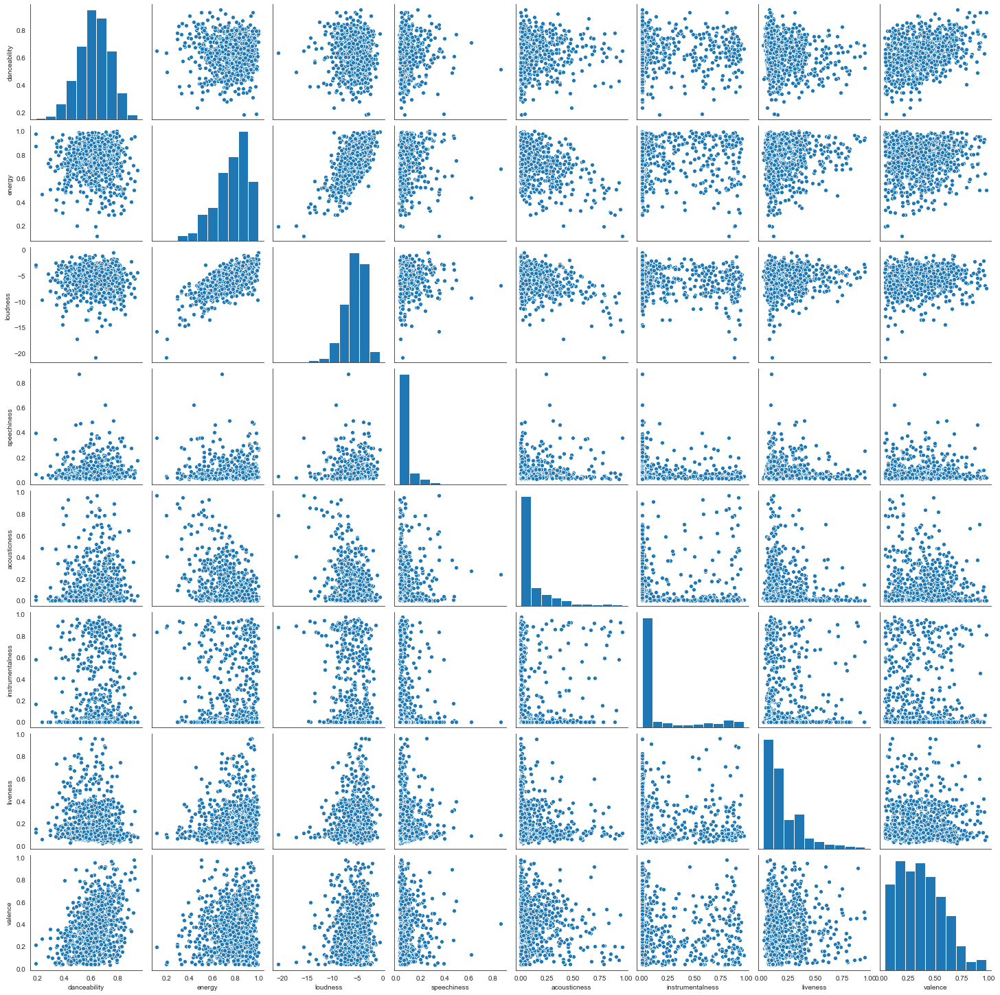

In [102]:
sns.pairplot(df[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence']])

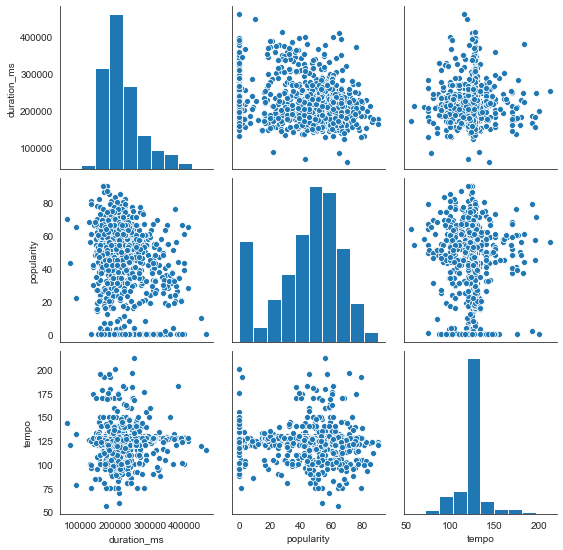

In [103]:
sns.pairplot(df[["duration_ms", "popularity", "tempo"]])

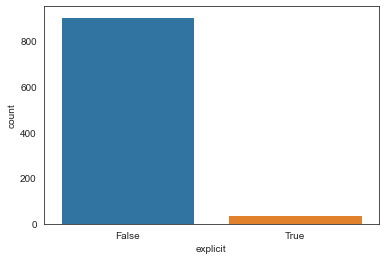

In [68]:
sns.countplot(df["explicit"])

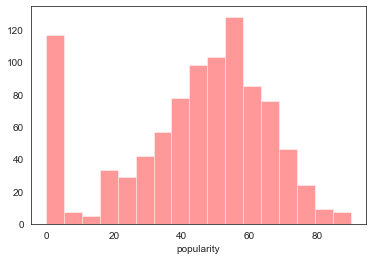

In [105]:
sns.distplot(df["popularity"], kde = False, color = "red")

(array([[  6.,   2.,   0.,   2.,   3.,   7.,   8.,   5.,   6.,   1.],
        [116.,  16.,  51.,  80., 127., 181., 173., 108.,  41.,  11.]]),
 array([ 0.,  9., 18., 27., 36., 45., 54., 63., 72., 81., 90.]),
 <a list of 2 Lists of Patches objects>)

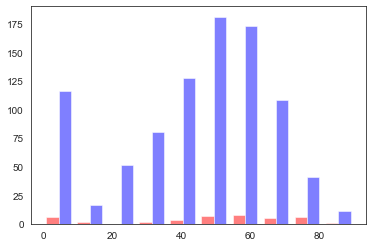

In [104]:
explicit_df = df[df["explicit"] == True]["popularity"]
clean_df = df[df["explicit"] == False]["popularity"]
plt.hist([explicit_df, clean_df], color=['r','b'], alpha=0.5)

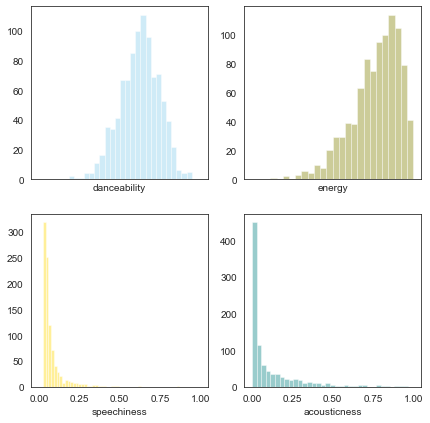

In [77]:
f, axes = plt.subplots(2, 2, figsize=(7, 7), sharex=True)
sns.distplot(df["danceability"], kde = False, color="skyblue", ax=axes[0, 0])
sns.distplot(df["energy"], kde = False, color="olive", ax=axes[0, 1])
sns.distplot(df["speechiness"], kde = False, color="gold", ax=axes[1, 0])
sns.distplot(df["acousticness"], kde = False, color="teal", ax=axes[1, 1])

Songs are on the higher side of danceable, high energy, not a lot of words, and very little acousticness
Pretty much to be expected

In [84]:
df[df["energy"] >= 0.99][["name", "energy"]]
#highest energy songs

,name,energy
41,Poppin' Pills,0.990
304,Drop To The Floor,0.995
370,Cream - Radio Edit,0.996
387,Satisfaction - RL Grime Remix,0.999


In [85]:
df[df["danceability"] >= 0.9][["name", "danceability"]]
#most danceable songs

,name,danceability
99,You Little Beauty,0.926
235,I'm Your Friend Juicy Pen (Radio Trap Edit),0.928
721,Mi Gente - Hugel Remix,0.946
724,HUMBLE. - SKRILLEX REMIX,0.901
844,Sirius,0.915
939,Talk,0.900
948,Dizzy,0.924


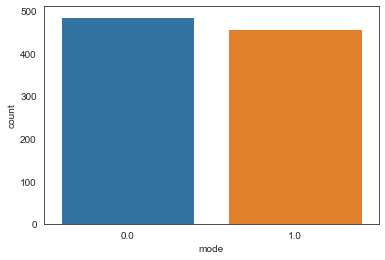

In [86]:
sns.countplot(df["mode"])

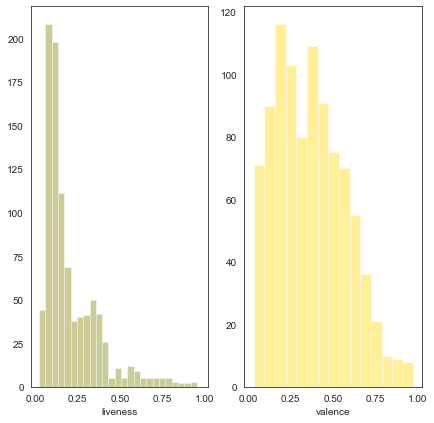

In [97]:
f, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(7, 7), sharex=True)
sns.distplot(df["liveness"], kde = False, color="olive", ax=axes[0])
sns.distplot(df["valence"], kde = False, color="gold", ax=axes[1])

In [98]:
#valence describes the musical positiveness conveyed by a track 
df[df["valence"] >= 0.9][["name", "valence"]]

,name,valence
51,Midnight (feat. Liam Payne) (Alesso & ESH Remix),0.909
59,Tried Everything,0.942
99,You Little Beauty,0.918
198,September - Eric Kupper Radio Mix,0.956
248,Instagram,0.950
402,Feel So Close - Radio Edit,0.919
424,Tung! - Radio Edit,0.905
563,Day 'N' Nite - Crookers Remix,0.965
895,Love Is Alive,0.915
948,Dizzy,0.977


In [99]:
df[df["liveness"] >= 0.9][["name", "liveness"]]

,name,liveness
351,Heartbeat - Nicky Romero Edit,0.912
568,Silence - Tiësto's Big Room Remix,0.956
599,Tremor - Sensation 2014 Anthem,0.955
704,Heaven To Me,0.949


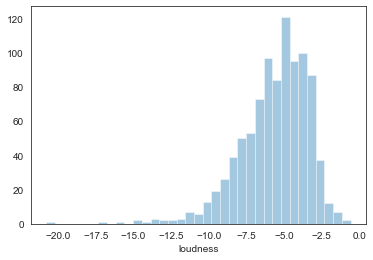

In [108]:
sns.distplot(df["loudness"], kde = False)

In [111]:
df[df["loudness"] >= -1.5][["name", "loudness"]]

,name,loudness
304,Drop To The Floor,-0.570
355,Metropolis - Edit,-1.148
368,Tremors (feat. Go Comet!),-1.480
479,With You (Jai Wolf Remix),-1.316
607,This Is Dirty,-1.406
633,Enjoy the Ride,-1.145
979,Sweet Lovin' - Original Mix,-1.214


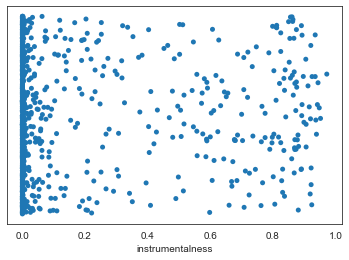

In [114]:
sns.stripplot(x=df["instrumentalness"])

In [117]:
df[df["instrumentalness"] > 0.94][["name", "instrumentalness"]]

,name,instrumentalness
16,NOPUS,0.952
399,SLVR,0.972
420,We Like to Party - Original Mix,0.944
425,Chasing Summers (Original Mix),0.948
438,Triton (Dance Valley 2013 Anthem) - Original Mix,0.942


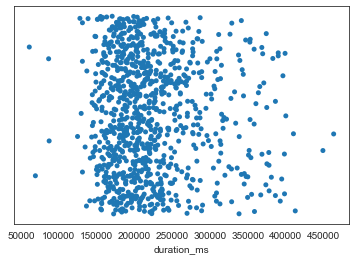

In [118]:
sns.stripplot(x=df["duration_ms"])

In [119]:
#look at longest and shortest songs
#less than 2 minutes or longer than 6 minuts
df[(df["duration_ms"] < 100000) | (df["duration_ms"] > 400000)][["name", "duration_ms"]]

,name,duration_ms
316,All That I Need feat. Cherokee - Dave DK Remix,449044
383,Greyhound,410096
511,Neon (Mix Cut) - Ryos Remix,87270
620,The Veldt - Tommy Trash Remix,412500
778,Clair De Lune,463226
1000,Intro,69093
1010,viola,86571
1030,virgo,61022


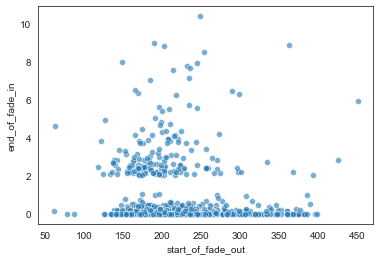

In [122]:
sns.scatterplot(x = "start_of_fade_out", y = "end_of_fade_in", data = df, alpha= 0.6)

Tiny bit of a positive trend between the timings

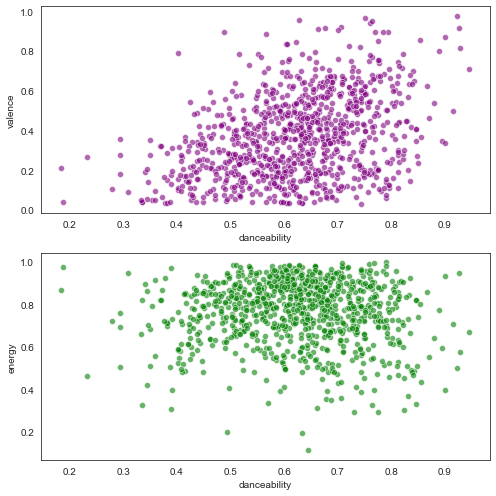

In [169]:
f, axes = plt.subplots(2, 1, figsize=(7, 7))
sns.scatterplot(x = "danceability", y = "valence", data = df, alpha= 0.6, color="purple", ax=axes[0])
sns.scatterplot(x = "danceability", y = "energy", data = df, alpha= 0.6, color="green", ax=axes[1])
plt.tight_layout()

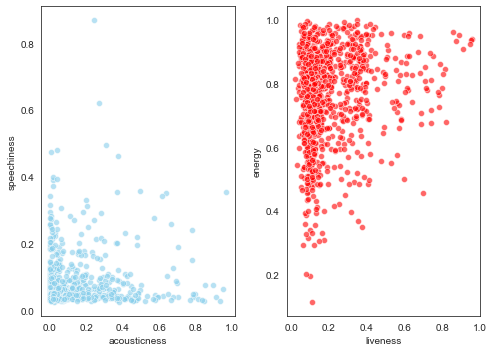

In [170]:
f, axes = plt.subplots(1, 2, figsize=(7, 5))
sns.scatterplot(x = "acousticness", y = "speechiness", data = df, alpha= 0.6, color="skyblue", ax=axes[0])
sns.scatterplot(x = "liveness", y = "energy", data = df, alpha= 0.6, color="red", ax=axes[1])
plt.tight_layout()

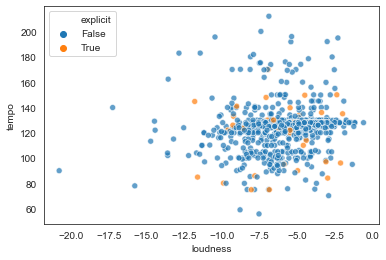

In [147]:
sns.scatterplot(x = "loudness", y = "tempo", data = df, alpha = 0.7, color = "orange", hue = "explicit")

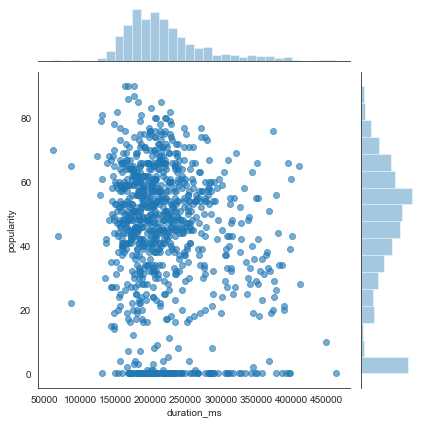

In [146]:
sns.jointplot(x = "duration_ms", y = "popularity", data = df, alpha = 0.6)

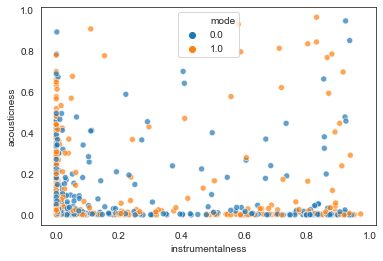

In [150]:
sns.scatterplot(x = "instrumentalness", y = "acousticness", data = df, alpha = 0.7, color = "violet", hue = "mode")

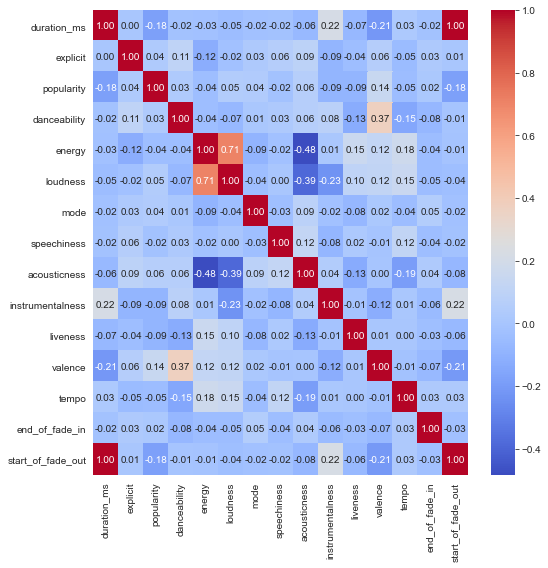

In [159]:
plt.figure(figsize= (8, 8))
sns.heatmap(df[['duration_ms', 'explicit', 'popularity', 'danceability',
       'energy', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'end_of_fade_in',
       'start_of_fade_out']].corr(), cmap= "coolwarm", annot = True, fmt='.2f')
plt.tight_layout()

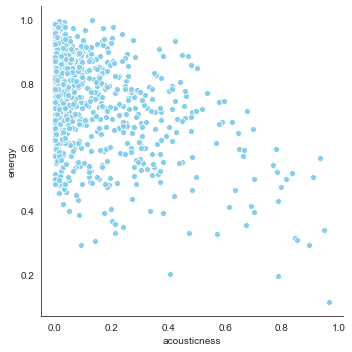

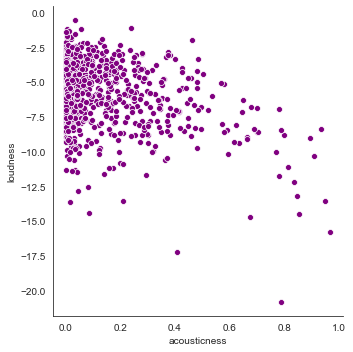

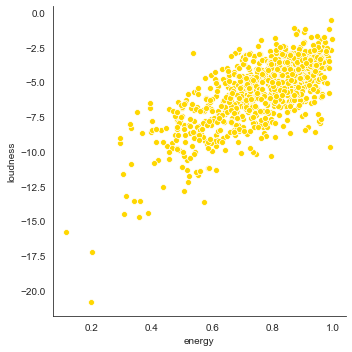

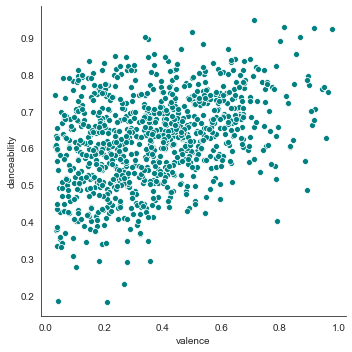

In [164]:
sns.relplot(x = "acousticness", y= "energy", data = df, color="skyblue")
sns.relplot(x = "acousticness", y= "loudness", data = df, color="purple")
sns.relplot(x = "energy", y= "loudness", data = df, color="gold")
sns.relplot(x = "valence", y= "danceability", data = df, color="teal")

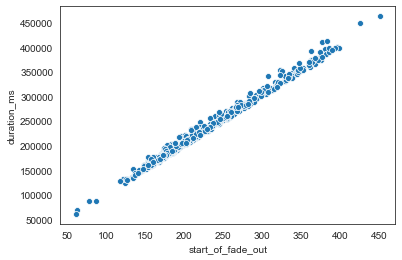

In [160]:
sns.scatterplot(x = "start_of_fade_out", y = "duration_ms", data = df)

## Part 3: Prediction